In [10]:
from tensorflow.keras.models import load_model
from PIL import Image ,  ImageOps
import matplotlib.pyplot as plt
import os
import cv2
import numpy as np
import tensorflow as tf
import glob
import re

In [11]:
def display_mask_test(model):
    X_test_rgb = imagePrep('data/test/*', 512, 512, 1)
    model = np.round(model)
    cnt = int(model.shape[0])
    plt.figure(figsize=(cnt*10, 20))
    for i, image_idx in enumerate(range(cnt)):
        x = np.array(model[image_idx].reshape(512,512,3) *255).astype('uint8')
        img = Image.fromarray(x)
        
        ax = plt.subplot(2, cnt, i + 1) 
        plt.imshow((X_test_rgb[image_idx]*255).astype('uint8'))
        ax.axis('off')
    
        ax = plt.subplot(2,cnt,cnt+ i+ 1) 
        plt.imshow(img)
        ax.axis('off')
    plt.show()
    return model


In [12]:
# 이미지 전처리
def imagePrep(path_pattern, WIDTH, HEIGHT, CHANNEL): 
    filelist = glob.glob(path_pattern)
    filelist = sorted(filelist, key=lambda s: int(re.search(r'\d+', s).group()))
    fileabslist = [os.path.abspath(fpath) for fpath in filelist]
    X = []
    for fname in fileabslist:
        img = cv2.imread(fname).astype('float32') / 255
        #print(img.shape)
        img = cv2.resize(img, (WIDTH, HEIGHT))
        if CHANNEL == 1:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            #img = np.expand_dims(img, axis=2)
        else:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
        X.append(img)
    X_array = np.array(X)
    return X_array

In [13]:
HEIGHT, WIDTH, CHANNEL = 512, 512, 3
X_test = imagePrep('data/test/*', WIDTH, HEIGHT, CHANNEL)
print(X_test.shape)

(12, 512, 512, 3)


In [16]:
tf.debugging.set_log_device_placement(False)

with tf.device('/CPU:0'):
    model_path= './model/test (528).hdf5'
    model = load_model(model_path)
    ae_imgs = model.predict(X_test)#앞서 만든 오토인코더 모델에 집어 넣습니다.

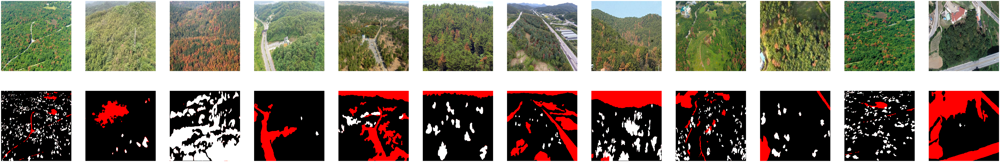

In [17]:
img = display_mask_test(ae_imgs)